<a href="https://colab.research.google.com/github/jideilori/DepthNet/blob/main/DepthNet_FROM_DeFeat_Net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TensorFlow ResNet18 

In [47]:
# slightly modified version from https://github.com/dexter2406/Monodepth2-TF2
from keras.layers import Dense, Conv2D,  MaxPool2D, Flatten, GlobalAveragePooling2D, \
BatchNormalization, Layer, Add,ZeroPadding2D, Activation
from keras.models import Sequential
from keras.models import Model
import tensorflow as tf

from keras import backend as K
K.get_session().graph.get_collection('variables')
K.clear_session()

class BasicBlock_nopad(tf.keras.layers.Layer):

    def __init__(self, filter_num, stride=1, block_id=-1, layer_id=-1):
        super(BasicBlock_nopad, self).__init__()
        prefix = 'conv%d_%d/' % (block_id, layer_id)
        # 1
        self.conv1 = Conv2D(filters=filter_num, kernel_size=(3, 3), strides=stride,
                            use_bias=False, padding="same", name=''.join([prefix, 'conv_1']))
        self.bn1 = BatchNormalization(name=''.join([prefix, 'BatchNorm_1']))
        self.a1 = Activation('relu')
        # 2
        self.conv2 = Conv2D(filters=filter_num, kernel_size=(3, 3),
                            use_bias=False, padding="same")
        self.bn2 = BatchNormalization(name=''.join([prefix, 'BatchNorm_2']))
        if stride != 1:
            self.downsample = tf.keras.Sequential()
            self.downsample.add(Conv2D(filters=filter_num, kernel_size=(1, 1), strides=stride,
                                       use_bias=False, padding="same", name=''.join([prefix, 'downsample'])))
            self.downsample.add(BatchNormalization(name='downsample/BatchNorm_3'))
        else:
            self.downsample = lambda x: x
        self.a2 = Activation('relu')

    def call(self, x, training=None, **kwargs):
        out = self.conv1(x)
        out = self.bn1(out, training=training)
        out = self.a1(out)
        out = self.conv2(out)
        out = self.bn2(out, training=training)

        identity = self.downsample(x)

        out = tf.keras.layers.add([identity, out])
        out = self.a2(out)
        return out

class BasicBlock_pad(tf.keras.layers.Layer):

    def __init__(self, filter_num, stride=1, padding_mode='same', block_id=-1, layer_id=-1):
        super(BasicBlock_pad, self).__init__()
        padding = 'same'
        prefix = 'conv%d_%d/' % (block_id, layer_id)
        # 1
        self.conv1 = Conv2D(filters=filter_num, kernel_size=(3, 3), strides=stride,
                            use_bias=False, padding=padding, name=''.join([prefix, 'conv_1']))
        self.bn1 = BatchNormalization(name=''.join([prefix, 'BatchNorm_1']))
        self.a1 = Activation('relu')
        # 2
        self.conv2 = Conv2D(filters=filter_num, kernel_size=(3, 3),
                            use_bias=False, padding=padding)
        self.bn2 = BatchNormalization(name=''.join([prefix, 'BatchNorm_2']))

        if stride != 1:
            self.downsample = tf.keras.Sequential()
            self.downsample.add(Conv2D(filters=filter_num, kernel_size=(1, 1), strides=stride,
                                       use_bias=False, padding='same', name=''.join([prefix, 'downsample'])))
            self.downsample.add(BatchNormalization(name='downsample/BatchNorm_3'))
        else:
            self.downsample = lambda x: x
        self.a2 = Activation('relu')

    def call(self, x, training=None, **kwargs):

        out = x
        out = self.conv1(out)
        out = self.bn1(out, training=training)
        out = self.a1(out)
        out = self.conv2(out)
        out = self.bn2(out, training=training)

        identity = self.downsample(x)

        out = tf.keras.layers.add([identity, out])
        out = self.a2(out)
        return out

class ResNet18_new(tf.keras.Model):
    def __init__(self, block_list=[2, 2, 2, 2], initial_filters=64, norm_inp=False):
        super(ResNet18_new, self).__init__()
        self.norm_inp = norm_inp

        self.num_blocks = len(block_list)
        self.block_list = block_list
        self.out_filters = initial_filters

        self.conv1 = Conv2D(filters=self.out_filters, kernel_size=(7, 7), strides=2,
                            use_bias=False, padding='same', name='conv1')
        self.bn1 = BatchNormalization(name='bn1')
        self.a1 = Activation('relu', name='relu')
        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=(3, 3), strides=2, padding="same", name='maxpool')

        self.layer1 = self._make_basic_block_layer(filter_num=64, blocks=block_list[0], block_id=1)
        self.layer2 = self._make_basic_block_layer(filter_num=128, blocks=block_list[1], stride=2, block_id=2)
        self.layer3 = self._make_basic_block_layer(filter_num=256, blocks=block_list[2], stride=2, block_id=3)
        self.layer4 = self._make_basic_block_layer(filter_num=512, blocks=block_list[3], stride=2, block_id=4)

    def _make_basic_block_layer(self, filter_num, blocks, stride=1, block_id=-1):
        res_block = tf.keras.Sequential(name='seq_%d' % block_id)
        res_block.add(BasicBlock_pad(filter_num, stride=stride, block_id=block_id, layer_id=1, padding_mode='same'))

        for i in range(1, blocks):
            res_block.add(BasicBlock_nopad(filter_num, stride=1, block_id=block_id, layer_id=i + 1))

        return res_block

    def is_train(self, block_id, unfreeze_num, training):
        if unfreeze_num is None:
            return training
        num_blocks = 5
        return (num_blocks-block_id) <= unfreeze_num

    def call(self, inputs, training=None, mask=None, unfreeze_num=None):
        if self.norm_inp:
            inputs = (inputs - 0.5) * 2
        outputs = []
        x = inputs
        x = self.conv1(x)
        x = self.bn1(x, training=self.is_train(0, unfreeze_num, training))
        x = self.a1(x)
        outputs.append(x)
        x = self.pool1(x)
        x = self.layer1(x, training=self.is_train(1, unfreeze_num, training))

        outputs.append(x)
        x = self.layer2(x, training=self.is_train(2, unfreeze_num, training))
        outputs.append(x)
        x = self.layer3(x, training=self.is_train(3, unfreeze_num, training))
        outputs.append(x)
        x = self.layer4(x, training=self.is_train(4, unfreeze_num, training))
        outputs.append(x)
        return outputs
        
resnet18_model = ResNet18_new([2, 2, 2, 2],norm_inp=False)

## ResNet18 Architecture built from pytorch ResNet18 visualized using [Netron](https://lutzroeder.github.io/netron/)

# Downloading the dataset

In [5]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
annotation_folder = "/dataset/"
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    annotation_zip = tf.keras.utils.get_file(
        "val.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
        extract=True,
    )

2774638592/2774625282 [==============================] - 63s 0us/step


# Preparing the Dataset

In [6]:
path = "val/indoors"
filelist = []
for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)

In [7]:
HEIGHT = 256
WIDTH = 256
LR = 0.0002
EPOCHS = 30
BATCH_SIZE = 32

# Building a data pipeline

In [8]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=6, dim=(768, 1024), n_channels=3, shuffle=True):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, image_path, depth_map, mask):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )

        return x, y


# Visualizing samples

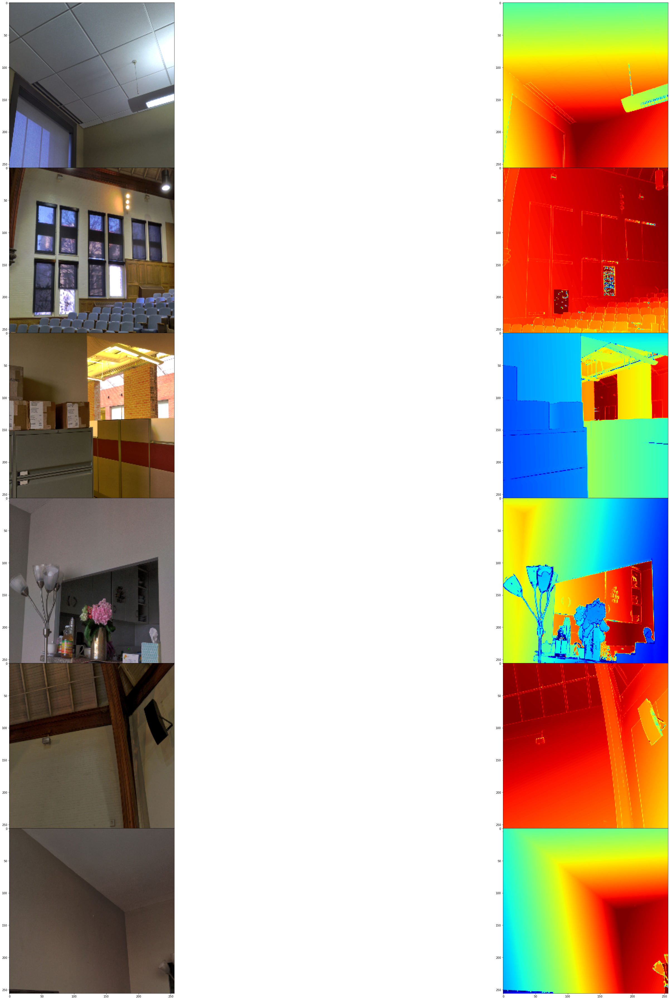

In [9]:
import numpy as np
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        fig.subplots_adjust(wspace=0, hspace=0)

        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        fig.tight_layout()

        fig.subplots_adjust(wspace=0, hspace=0)

        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH)))
)
visualize_depth_map(visualize_samples)

In [10]:
# depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target
# img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input

# fig = plt.figure(figsize=(15, 10))
# ax = plt.axes(projection="3d")

# STEP = 3
# for x in range(0, img_vis.shape[0], STEP):
#     for y in range(0, img_vis.shape[1], STEP):
#         ax.scatter(
#             [depth_vis[x, y]] * 3,
#             [y] * 3,
#             [x] * 3,
#             c=tuple(img_vis[x, y, :3] / 255),
#             s=3,
#         )
#     ax.view_init(45, 135)

# Building the Model and defining loss

In [48]:
from collections import OrderedDict
import numpy as np
from keras.layers import Concatenate
from keras import backend as K
from collections import OrderedDict

import tensorflow as tf
from keras.layers import Lambda
import numpy as np


class TF_simple_conv_block_new(tf.keras.layers.Layer):
    def __init__(self,in_channels,out_channels):
        super(TF_simple_conv_block_new, self).__init__()
        self.conv = TF_conv_3x3_new(in_channels,out_channels)
        self.nonlin = tf.keras.layers.ELU(alpha=1.0)

    def call(self, inputs, training=None, mask=None, unfreeze_num=None):
      return self.nonlin(self.conv(inputs))
    
class TF_conv_3x3_new(tf.keras.layers.Layer):
    def __init__(self,in_channels, out_channels, use_refl=True):
        super(TF_conv_3x3_new, self).__init__()
        self.reflect_pad = Lambda(lambda x: tf.pad(x, [[0,0],[1,1],[1,1],[0,0]], 'REFLECT'))
        self.zeropad = Lambda(lambda x:tf.pad(x,[[0,0],[1,1],[1,1],[0,0]],'CONSTANT'))
        if use_refl:
          self.pad = self.reflect_pad
        else:
          self.pad = self.zeropad
        self.conv = tf.keras.layers.Conv2D(out_channels,3)
    
    def call(self, inputs, training=None, mask=None, unfreeze_num=None):
      return self.conv(self.pad(inputs))


class DepthEstimationModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = tf.keras.metrics.Mean(name="loss")
       
        self.tf_num_layers: int = 18 #choices=[18, 34, 50, 101, 152]
        self.tf_scales: list = range(4)  #0,1,2,3 
        self.tf_use_skips: bool = True
      
        self.tf_enc_ch = np.array([64, 64, 128, 256, 512])
        self.tf_dec_ch = np.array([16, 32, 64, 128, 256])
        if self.tf_num_layers > 34:
          self.tf_enc_ch[1:] *= 4

        # Build multiscale decoder
        self.tf_convs = OrderedDict() 
        for i in range(4, -1, -1):
            self.tf_in_ch = self.tf_enc_ch[-1] if i == 4 else self.tf_dec_ch[i + 1]
            self.tf_convs[('upconv', i, 0)] = TF_simple_conv_block_new(self.tf_in_ch, self.tf_dec_ch[i])

            self.tf_in_ch = self.tf_dec_ch[i] + (self.tf_enc_ch[i - 1] if self.tf_use_skips and i > 0 else 0)
            self.tf_convs[('upconv', i, 1)] = TF_simple_conv_block_new(self.tf_in_ch, self.tf_dec_ch[i])

        # Upsample convs for each scale
        for s in self.tf_scales:
            self.tf_convs[('dispconv', s)] = TF_conv_3x3_new(self.tf_dec_ch[s], 1)
            
            


    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)
        weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
        weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = tf.reduce_mean(abs(smoothness_x)) + tf.reduce_mean(
            abs(smoothness_y)
        )

        # Structural similarity (SSIM) index
        ssim_loss = tf.reduce_mean(
            1
            - tf.image.ssim(
                target, pred, max_val=WIDTH, filter_size=7, k1=0.01 ** 2, k2=0.03 ** 2
            )
        )
        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))

        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, x):
        tf_features, tf_outputs = [], {}
        # inp_tfx = (x - 0.45) / 0.225
        inp_tfx = x

        res_model= resnet18_model
        tfx = res_model.get_layer('conv1')(inp_tfx)
        tfx = res_model.get_layer('bn1')(tfx)
        tf_features.append(res_model.get_layer('relu')(tfx))

        tf_features.append(res_model.get_layer('seq_1')(res_model.get_layer('maxpool')(tf_features[-1])))
        tf_features.append(res_model.get_layer('seq_2')(tf_features[-1]))
        tf_features.append(res_model.get_layer('seq_3')(tf_features[-1]))
        tf_features.append(res_model.get_layer('seq_4')(tf_features[-1]))

        # Decoder
        x = tf_features[-1]        
        for i in range(4, -1, -1):
          x = self.tf_convs[('upconv', i, 0)](x)
          x = tf.keras.layers.UpSampling2D()(x)
          if self.tf_use_skips and i > 0:
              x = Concatenate(axis=3)([x, tf_features[i - 1]])
          x=self.tf_convs[('upconv', i, 1)](x)
          if i in self.tf_scales:
              out = self.tf_convs[('dispconv', i)](x)
              
        return out

# MODEL TRAINING

In [49]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LR,
    amsgrad=False,
)
model = DepthEstimationModel()
# Define the loss function
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction="none"
)
# Compile the model
model.compile(optimizer, loss=cross_entropy)

train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)


In [50]:
model.fit(
    train_loader,
    epochs=10,
    validation_data=validation_loader
)

Epoch 1/10
9/9 [==============================] - 26s 3s/step - loss: 0.5251 - val_loss: 0.3136
Epoch 2/10
9/9 [==============================] - 3s 322ms/step - loss: 0.3047 - val_loss: 0.2659
Epoch 3/10
9/9 [==============================] - 3s 318ms/step - loss: 0.2400 - val_loss: 0.1603
Epoch 4/10
9/9 [==============================] - 3s 323ms/step - loss: 0.2496 - val_loss: 0.1594
Epoch 5/10
9/9 [==============================] - 3s 317ms/step - loss: 0.2894 - val_loss: 0.1516
Epoch 6/10
9/9 [==============================] - 3s 318ms/step - loss: 0.2496 - val_loss: 0.1571
Epoch 7/10
9/9 [==============================] - 3s 324ms/step - loss: 0.2471 - val_loss: 0.1375
Epoch 8/10
9/9 [==============================] - 3s 326ms/step - loss: 0.2731 - val_loss: 0.1308
Epoch 9/10
9/9 [==============================] - 3s 319ms/step - loss: 0.3146 - val_loss: 0.1648
Epoch 10/10
9/9 [==============================] - 3s 318ms/step - loss: 0.2867 - val_loss: 0.1197


# Testing

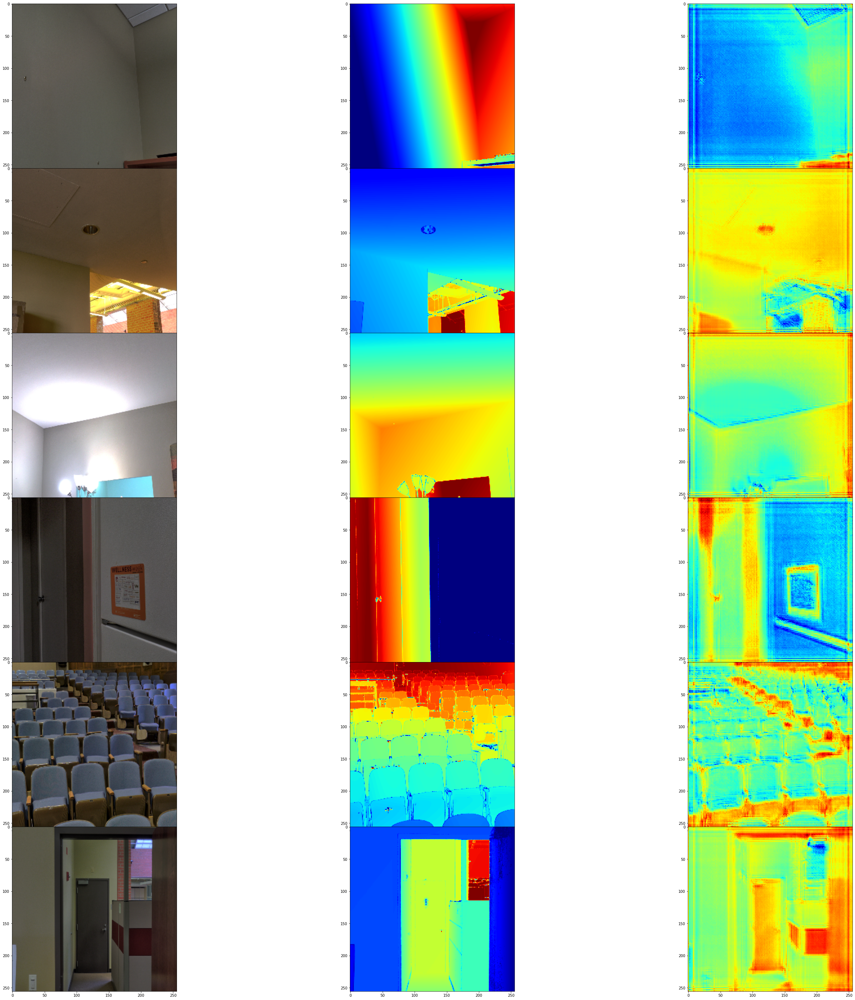

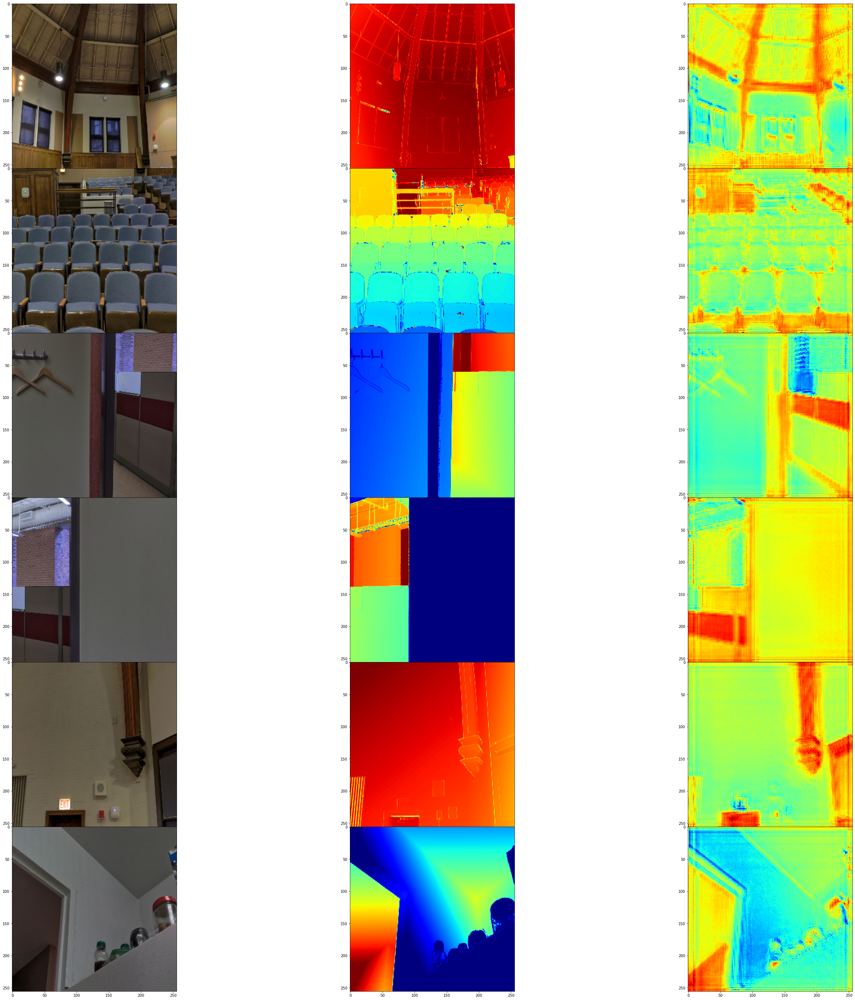

In [51]:
test_loader = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

test_loader = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

(256, 256, 3)
(1, 256, 256, 3)
(256, 256)


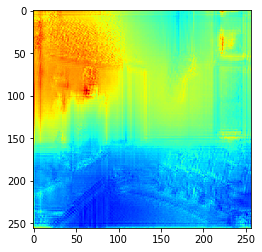

In [54]:
import cv2
img_test = cv2.imread('/content/val/indoors/scene_00019/scan_00183/00019_00183_indoors_000_010.png')
img_test = cv2.resize(img_test,(256,256))
print(img_test.shape)
img_test = np.expand_dims(img_test,0).astype(float)
# img_test = (img_test - 0.45) / 0.225
# img_test = (img_test - 0.5) *2

print(img_test.shape)

result = model.predict(img_test)
ff = result.squeeze(0)
ff = ff.squeeze(2)
print(ff.shape)
plt.imshow(ff,cmap='jet')